# Matrix Factorization

In this chapter we will build a recommendation system using matrix factorisation and TensorFlow. Matrix factorisation is a form of collaborative filtering which decomposes the user-item iteraction matrix into the product of two lower dimensionality matrices (cite:https://ieeexplore.ieee.org/document/5197422). Recommendations can often be improved by assigning regularization weights based on items' popularity and users' engagement levels (cite: https://dl.acm.org/doi/10.1145/3285954).

The work done in this chapter involves reproducing and adapting the work done in this [Google Colab](https://colab.research.google.com/github/google/eng-edu/blob/main/ml/recommendation-systems/recommendation-systems.ipynb?utm_source=ss-recommendation-systems&utm_campaign=colab-external&utm_medium=referral&utm_content=recommendation-systems#scrollTo=WEhp-q31o4tS[collab](https://)) for our cleaned Last.fm dataset.

## Outline
  1. Preliminaries
  1. Training matrix factorization model
  1. Inspect the Embeddings
  1. Regularization in matrix factorization

## Import required packages

In [1]:
import numpy as np
import pandas as pd
import collections
from ast import literal_eval
from mpl_toolkits.mplot3d import Axes3D
from IPython import display
from matplotlib import pyplot as plt
import sklearn
import sklearn.manifold
import tensorflow.compat.v1 as tf
# tf.disable_v2_behavior()
# tf.logging.set_verbosity(tf.logging.ERROR)
tf.compat.v1.disable_eager_execution()

# Add some convenience functions to Pandas DataFrame.
pd.options.display.max_rows = 10
pd.options.display.float_format = '{:.3f}'.format
def mask(df, key, function):
    """Returns a filtered dataframe, by applying function to key"""
    return df[function(df[key])]

def flatten_cols(df):
    df.columns = [' '.join(col).strip() for col in df.columns.values]
    return df

pd.DataFrame.mask = mask
pd.DataFrame.flatten_cols = flatten_cols

import altair as alt
alt.data_transformers.enable('default', max_rows=None)
alt.renderers.enable('html')

RendererRegistry.enable('html')

## Import Data

In [2]:
listens = pd.read_csv('..\\data\\processed\\listens.csv', index_col=0,encoding='utf-8')
artists_df = pd.read_csv('..\\data\\processed\\artist_info.csv', index_col=0,encoding='utf-8')
artists = pd.read_csv('..\\data\\processed\\artists.csv', index_col=0,encoding='utf-8')

In [3]:
artists_df.id = artists_df.id.astype('str')
artists_df.peak_year = artists_df.peak_year.astype('str')
artists_df.all_tags = artists_df.all_tags.apply(lambda x: literal_eval(x))
artists.id = artists.id.astype('str')
listens.userID = listens.userID.astype('str')
listens.artistID = listens.artistID.astype('str')

## I. Preliminaries

Our goal is to factorize the listens matrix $A$ into the product of a user embedding matrix $U$ and artists embedding matrix $V$, such that  
$A \approx UV^\top$ with
$U = \begin{bmatrix} u_{1} \\ \hline \vdots \\ \hline u_{N} \end{bmatrix}$ and
$V = \begin{bmatrix} v_{1} \\ \hline \vdots \\ \hline v_{M} \end{bmatrix}$.

Here
- $N$ is the number of users,
- $M$ is the number of artists,
- $A_{ij}$ is the listening count of the $j$th artist by the $i$th user,
- each row $U_i$ is a $d$-dimensional vector (embedding) representing user $i$,
- each row $V_j$ is a $d$-dimensional vector (embedding) representing artist $j$,
- the prediction of the model for the $(i, j)$ pair is the dot product $\langle U_i, V_j \rangle$.

### Sparse Representation of the Rating Matrix

In general, most of the entries are unobserved, since a given user will only listen to a small subset of artists. For effcient representation, we will use a [tf.SparseTensor](https://www.tensorflow.org/api_docs/python/tf/SparseTensor). A `SparseTensor` uses three tensors to represent the matrix: `tf.SparseTensor(indices, values, dense_shape)` represents a tensor, where a value $A_{ij} = a$ is encoded by setting `indices[k] = [i, j]` and `values[k] = a`. The last tensor `dense_shape` is used to specify the shape of the full underlying matrix.   
Our dataset contains 1,892 users and 17,632 artists. Therefore, the `dense_shape` will be set to `[1892,17632]`.

In [4]:
# Function that maps from listens DataFrame to a tf.SparseTensor.
def build_listens_sparse_tensor(listens_df):
    """
      Args:
        listens_df: a pd.DataFrame with `userID`, `artistID` and `listenCount` columns.
      Returns:
        a tf.SparseTensor representing the listens matrix.
    """
    indices = listens_df[['userID', 'artistID']].values
    values = listens_df['listenCount'].values
    return tf.SparseTensor(
        indices=indices,
        values=values,
        dense_shape=[listens.userID.nunique(), listens.artistID.nunique()])

### Calculating the Error

The model approximates the ratings matrix $A$ by a low-rank product $UV^\top$. We need a way to measure the approximation error. We'll use the Mean Squared Error of observed entries only. It is defined as

$$
\begin{align*}
\text{MSE}(A, UV^\top)
&= \frac{1}{|\Omega|}\sum_{(i, j) \in\Omega}{( A_{ij} - (UV^\top)_{ij})^2} \\
&= \frac{1}{|\Omega|}\sum_{(i, j) \in\Omega}{( A_{ij} - \langle U_i, V_j\rangle)^2}
\end{align*}
$$
where $\Omega$ is the set of observed ratings, and $|\Omega|$ is the cardinality of $\Omega$.

Function that takes a sparse listens matrix $A$ and the two embedding matrices $U, V$ and returns the mean squared error $\text{MSE}(A, UV^\top)$.

In [5]:
def sparse_mean_square_error(sparse_listens, user_embeddings, artist_embeddings):
    """
      Args:
        sparse_listens: A SparseTensor listens matrix, of dense_shape [N, M]
        user_embeddings: A dense Tensor U of shape [N, k] where k is the embedding
          dimension, such that U_i is the embedding of user i.
        artist_embeddings: A dense Tensor V of shape [M, k] where k is the embedding
          dimension, such that V_j is the embedding of artist j.
      Returns:
        A scalar Tensor representing the MSE between the true ratings and the
          model's predictions.
    """
    predictions = tf.gather_nd(
        tf.matmul(user_embeddings, artist_embeddings, transpose_b=True),
        sparse_listens.indices)
    loss = tf.losses.mean_squared_error(sparse_listens.values, predictions)
    return loss

Computes the full prediction matrix  UV⊤, then gather the entries corresponding to the observed pairs. The memory cost of this approach is  O(NM). For the Lastfm dataset, this is fine, as the dense  N×M  matrix is small enough to fit in memory ( N=1892,  M=17632 ).

## II. Training the Matrix Factorization model

### CFModel (Collaborative Filtering Model) helper class

This is a simple class to train a matrix factorization model using stochastic gradient descent.

The class constructor takes
- the user embeddings U (a `tf.Variable`).
- the artist embeddings V, (a `tf.Variable`).
- a loss to optimize (a `tf.Tensor`).
- an optional list of metrics dictionaries, each mapping a string (the name of the metric) to a tensor. These are evaluated and plotted during training (e.g. training error and test error).

#### CFModel (Collaborative Filtering Model)

In [6]:
class CFModel(object):
    """Simple class that represents a collaborative filtering model"""
    def __init__(self, embedding_vars, loss, metrics=None):
        """Initializes a CFModel.
        Args:
        embedding_vars: A dictionary of tf.Variables.
        loss: A float Tensor. The loss to optimize.
        metrics: optional list of dictionaries of Tensors. The metrics in each
        dictionary will be plotted in a separate figure during training.
        """
        self._embedding_vars = embedding_vars
        self._loss = loss
        self._metrics = metrics
        self._embeddings = {k: None for k in embedding_vars}
        self._session = None

    @property
    def embeddings(self):
        """The embeddings dictionary."""
        return self._embeddings
    
    def train(self, num_iterations=10, learning_rate=1.0, plot_results=True,
              optimizer=tf.train.GradientDescentOptimizer):
        """Trains the model.
            Args:
              iterations: number of iterations to run.
              learning_rate: optimizer learning rate.
              plot_results: whether to plot the results at the end of training.
              optimizer: the optimizer to use. Default to GradientDescentOptimizer.
            Returns:
              The metrics dictionary evaluated at the last iteration.
        """
        with self._loss.graph.as_default():
            opt = optimizer(learning_rate)
            train_op = opt.minimize(self._loss)
            local_init_op = tf.group(
                tf.variables_initializer(opt.variables()),
                tf.local_variables_initializer())
            if self._session is None:
                self._session = tf.Session()
                with self._session.as_default():
                    self._session.run(tf.global_variables_initializer())
                    self._session.run(tf.tables_initializer())
                    # tf.train.start_queue_runners()

        with self._session.as_default():
            local_init_op.run()
            iterations = []
            metrics = self._metrics or ({},)
            metrics_vals = [collections.defaultdict(list) for _ in self._metrics]

            
            # Train and append results.
            for i in range(num_iterations + 1):
                _, results = self._session.run((train_op, metrics))
                if (i % 10 == 0) or i == num_iterations:
                    print("\r iteration %d: " % i + ", ".join(
                        ["%s=%f" % (k, v) for r in results for k, v in r.items()]),
                          end='')
                    iterations.append(i)
                    for metric_val, result in zip(metrics_vals, results):
                        for k, v in result.items():
                            metric_val[k].append(v)
      
            for k, v in self._embedding_vars.items():
                self._embeddings[k] = v.eval()

            if plot_results:
                # Plot the metrics.
                num_subplots = len(metrics)+1
                fig = plt.figure()
                fig.set_size_inches(num_subplots*10, 8)
                for i, metric_vals in enumerate(metrics_vals):
                    ax = fig.add_subplot(1, num_subplots, i+1)
                    for k, v in metric_vals.items():
                        ax.plot(iterations, v, label=k)
                        ax.set_xlim([1, num_iterations])
                        ax.legend()
            return results

#### Matrix Factorization model

In [7]:
# Utility to split the data into training and test sets.
def split_dataframe(df, holdout_fraction=0.1):
    """Splits a DataFrame into training and test sets.
      Args:
        df: a dataframe.
        holdout_fraction: fraction of dataframe rows to use in the test set.
      Returns:
        train: dataframe for training
        test: dataframe for testing
    """
    test = df.sample(frac=holdout_fraction, replace=False)
    train = df[~df.index.isin(test.index)]
    return train, test

In [8]:
def build_model(listens, embedding_dim=3, init_stddev=1.):
    """
    Args:
    listens: a DataFrame of the listen counts
    embedding_dim: the dimension of the embedding vectors.
    init_stddev: float, the standard deviation of the random initial embeddings.
    Returns:
    model: a CFModel.
    """
    # Split the listens DataFrame into train and test.
    train_listens, test_listens = split_dataframe(listens)
    # SparseTensor representation of the train and test datasets.
    A_train = build_listens_sparse_tensor(train_listens)
    A_test = build_listens_sparse_tensor(test_listens)
    # Initialize the embeddings using a normal distribution.
    U = tf.Variable(tf.random_normal(
        [A_train.dense_shape[0], embedding_dim], stddev=init_stddev))
    V = tf.Variable(tf.random_normal(
        [A_train.dense_shape[1], embedding_dim], stddev=init_stddev))
    train_loss = sparse_mean_square_error(A_train, U, V)
    test_loss = sparse_mean_square_error(A_test, U, V)

    metrics = {
        'train_error': train_loss,
        'test_error': test_loss
    }
    embeddings = {
        "userID": U,
        "artistID": V
    }
    return CFModel(embeddings, train_loss, [metrics])

#### Train the Matrix Factorization model

 iteration 1000: train_error=0.105881, test_error=2.284283

[{'train_error': 0.1058807, 'test_error': 2.2842832}]

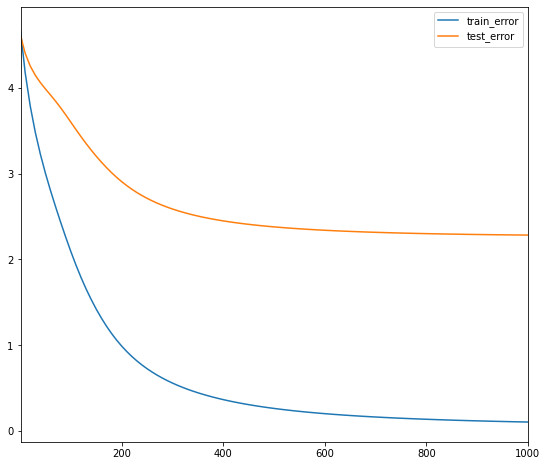

In [10]:
# Build the CF model and train it.
model = build_model(listens, embedding_dim=30, init_stddev=0.5)
model.train(num_iterations=1000, learning_rate=10.)

A sharp drop in the training error is observered. However, the test error, as expected, has a less pronounced drop in error rate. The test error pretty quickly plateaus around 2.6.

## III. Inspecting the Embeddings

In this section, we take a closer look at the learned embeddings, by
- computing recommendations
- looking at the nearest neighbors of some artists,
- looking at the norms of the artist embeddings,
- visualizing the embedding in a projected embedding space.

### Function to compute the scores of the candidates

We start by writing a function that, given a query embedding $u \in \mathbb R^d$ and item embeddings $V \in \mathbb R^{N \times d}$, computes the item scores.

There are different similarity measures we can use, and these can yield different results. We will compare the following:
- dot product: the score of item j is $\langle u, V_j \rangle$.
- cosine: the score of item j is $\frac{\langle u, V_j \rangle}{\|u\|\|V_j\|}$.

In [11]:
DOT = 'dot'
COSINE = 'cosine'
def compute_scores(query_embedding, item_embeddings, measure=DOT):
    """Computes the scores of the candidates given a query.
      Args:
        query_embedding: a vector of shape [k], representing the query embedding.
        item_embeddings: a matrix of shape [N, k], such that row i is the embedding
          of item i.
        measure: a string specifying the similarity measure to be used. Can be
          either DOT or COSINE.
      Returns:
        scores: a vector of shape [N], such that scores[i] is the score of item i.
        """
    u = query_embedding
    V = item_embeddings
    if measure == COSINE:
        V = V / np.linalg.norm(V, axis=1, keepdims=True)
        u = u / np.linalg.norm(u)
    scores = u.dot(V.T)
    return scores

Equipped with this function, we can compute recommendations, where the query embedding can be either a user embedding or an artist embedding.

### Artist Nearest Neighbors

In [12]:
def artist_neighbors(model, artist_substring, measure=DOT, k=6):
    # Search for artist ids that match the given substring.
    ids =  artists[artists['name'].str.contains(artist_substring)].index.values
    names = artists.iloc[ids]['name'].values
    if len(names) == 0:
        raise ValueError("Found no artists with name %s" % artist_substring)
    print("Nearest neighbors of : %s." % names[0])
    if len(names) > 1:
        print("[Found more than one matching artist. Other candidates: {}]".format(
            ", ".join(names[1:])))
    artist_id = ids[0]
    scores = compute_scores(
        model.embeddings["artistID"][artist_id], model.embeddings["artistID"],
        measure)
    score_key = measure + ' score'
    df = pd.DataFrame({
        score_key: list(scores),
        'names': artists['name'],
    })
    display.display(df.sort_values([score_key], ascending=False).head(k))


In [13]:
artist_neighbors(model, 'Coldplay', DOT)
artist_neighbors(model, 'Coldplay', COSINE)

Nearest neighbors of : Coldplay.
[Found more than one matching artist. Other candidates: Jay-Z & Coldplay, Coldplay/U2]


,dot score,names
167,3.899,Placebo
59,3.862,Coldplay
148,3.771,Radiohead
10156,3.720,The Heart Attacks
9079,3.694,Chris Lambert
698,3.668,The Pretty Reckless


Nearest neighbors of : Coldplay.
[Found more than one matching artist. Other candidates: Jay-Z & Coldplay, Coldplay/U2]


,cosine score,names
59,1.000,Coldplay
184,0.931,Muse
1391,0.928,MGMT
222,0.919,Kings of Leon
214,0.909,Red Hot Chili Peppers
371,0.907,Linkin Park


These recommendations based on similar artists to Coldplay are decent. Mostof the are bands, primarily rock bands. Lady Gaga appears to be odd suggestion, but it is conceivable that listening patterns for Coldplay and Lady Gaga are similar as both artist would have been popular around the same time. Both similarity measures result in the recommendation of low popularity artists such as Lich King and Alanis Morissette.

### Artist Embedding Norm

With dot-product, the model tends to recommend popular artists. This can be explained by the fact that in matrix factorization models, the norm of the embedding is often correlated with popularity (popular artists have a larger norm), which makes it more likely to recommend more popular items. We can confirm this hypothesis by sorting the artists by their embedding norm, as done in the next cell.

In [14]:
def artist_embedding_norm(models):
  """Visualizes the norm and number of ratings of the artist embeddings.
  Args:
    model: A MFModel object.
  """
  if not isinstance(models, list):
    models = [models]
  df = pd.DataFrame({
      'name': artists_df['name'],
      'tag': artists_df['tag_1'],
      'listen_count': artists_df['listen_count'],
  })
  charts = []
  brush = alt.selection_interval()
  for i, model in enumerate(models):
    norm_key = 'norm'+str(i)
    df[norm_key] = np.linalg.norm(model.embeddings["artistID"], axis=1)
    nearest = alt.selection(
        type='single', encodings=['x', 'y'], on='mouseover', nearest=True,
        empty='none')
    base = alt.Chart().mark_circle().encode(
        x='listen_count',
        y=norm_key,
        color=alt.condition(brush, alt.value('#4c78a8'), alt.value('lightgray'))
    ).properties(
        selection=nearest).add_selection(brush)
    text = alt.Chart().mark_text(align='center', dx=5, dy=-5).encode(
        x='listen_count', y=norm_key,
        text=alt.condition(nearest, 'name', alt.value('')))
    charts.append(alt.layer(base, text))
  return alt.hconcat(*charts, data=df)

def visualize_artist_embeddings(data, x, y):
  nearest = alt.selection(
      type='single', encodings=['x', 'y'], on='mouseover', nearest=True,
      empty='none')
  base = alt.Chart().mark_circle().encode(
      x=x,
      y=y,
#       color=alt.condition(genre_filter, "tag", alt.value("whitesmoke")),
  ).properties(
      width=600,
      height=600,
      selection=nearest)
  text = alt.Chart().mark_text(align='left', dx=5, dy=-5).encode(
      x=x,
      y=y,
      text=alt.condition(nearest, 'name', alt.value('')))
  return alt.hconcat(alt.layer(base, text), data=data)

def tsne_artist_embeddings(model):
  """Visualizes the artist embeddings, projected using t-SNE with Cosine measure.
  Args:
    model: A MFModel object.
  """
  tsne = sklearn.manifold.TSNE(
      n_components=2, perplexity=40, metric='cosine', early_exaggeration=10.0,
      init='pca', verbose=True, n_iter=400)

  print('Running t-SNE...')
  V_proj = tsne.fit_transform(model.embeddings["artistID"])
  artists_df.loc[:,'x'] = V_proj[:, 0]
  artists_df.loc[:,'y'] = V_proj[:, 1]
  return visualize_artist_embeddings(artists_df, 'x', 'y')

In [15]:
artist_embedding_norm(model)

alt.HConcatChart(...)

 iteration 1000: train_error=0.228160, test_error=0.625372

alt.HConcatChart(...)

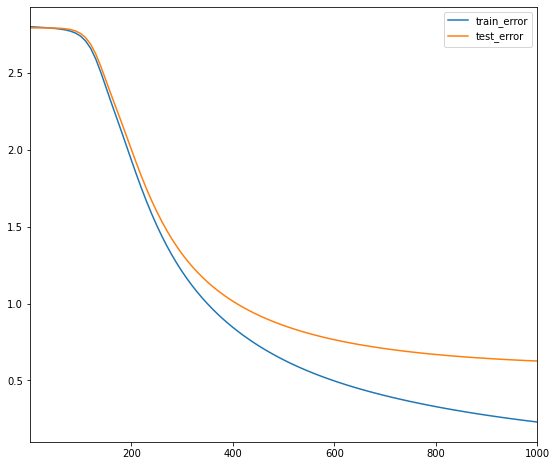

In [16]:
model_lowinit = build_model(listens, embedding_dim=30, init_stddev=0.05)
model_lowinit.train(num_iterations=1000, learning_rate=10.)
artist_embedding_norm([model, model_lowinit])

Lady Gaga, the most popular artist in the dataset is the dot furthest to the right. Hovering over the dots on the right side of the visualisation, I recognize almost all of them. However, I do not recognize most artists on the left. This norm of the embedding is now correlated with popularity. This has caused the test error to greatly reduce to 0.6. The model is improving.

In [17]:
artist_neighbors(model_lowinit, "Coldplay", DOT)
artist_neighbors(model_lowinit, "Coldplay", COSINE)

Nearest neighbors of : Coldplay.
[Found more than one matching artist. Other candidates: Jay-Z & Coldplay, Coldplay/U2]


,dot score,names
59,3.535,Coldplay
184,2.294,Muse
221,2.103,The Beatles
223,1.998,The Killers
222,1.980,Kings of Leon
1089,1.897,BjÃ¶rk


Nearest neighbors of : Coldplay.
[Found more than one matching artist. Other candidates: Jay-Z & Coldplay, Coldplay/U2]


,cosine score,names
59,1.000,Coldplay
9010,0.754,Gufi
486,0.746,Funeral for a Friend
7182,0.738,RelespÃºblica
7484,0.738,Tocotronic
1961,0.724,The Black Keys


The relevance of the recommendations made using the dot product has correspondingly increased.

### Embedding visualization

Since it is hard to visualize embeddings in a higher-dimensional space (when the embedding dimension  k>3 ), one approach is to project the embeddings to a lower dimensional space. T-SNE (T-distributed Stochastic Neighbor Embedding) is an algorithm that projects the embeddings while attempting to preserve their pariwise distances.

In [20]:
tsne_artist_embeddings(model_lowinit)

Running t-SNE...
[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 17632 samples in 0.001s...


C:\Users\User\anaconda3\envs\ml_recomsys\lib\site-packages\sklearn\manifold\_t_sne.py:790: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(
C:\Users\User\anaconda3\envs\ml_recomsys\lib\site-packages\sklearn\manifold\_t_sne.py:819: FutureWarning: 'square_distances' has been introduced in 0.24 to help phase out legacy squaring behavior. The 'legacy' setting will be removed in 1.1 (renaming of 0.26), and the default setting will be changed to True. In 1.3, 'square_distances' will be removed altogether, and distances will be squared by default. Set 'square_distances'=True to silence this warning.
  warnings.warn(


[t-SNE] Computed neighbors for 17632 samples in 11.678s...
[t-SNE] Computed conditional probabilities for sample 1000 / 17632
[t-SNE] Computed conditional probabilities for sample 2000 / 17632
[t-SNE] Computed conditional probabilities for sample 3000 / 17632
[t-SNE] Computed conditional probabilities for sample 4000 / 17632
[t-SNE] Computed conditional probabilities for sample 5000 / 17632
[t-SNE] Computed conditional probabilities for sample 6000 / 17632
[t-SNE] Computed conditional probabilities for sample 7000 / 17632
[t-SNE] Computed conditional probabilities for sample 8000 / 17632
[t-SNE] Computed conditional probabilities for sample 9000 / 17632
[t-SNE] Computed conditional probabilities for sample 10000 / 17632
[t-SNE] Computed conditional probabilities for sample 11000 / 17632
[t-SNE] Computed conditional probabilities for sample 12000 / 17632
[t-SNE] Computed conditional probabilities for sample 13000 / 17632
[t-SNE] Computed conditional probabilities for sample 14000 / 1763

C:\Users\User\anaconda3\envs\ml_recomsys\lib\site-packages\sklearn\manifold\_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


[t-SNE] KL divergence after 100 iterations with early exaggeration: 79.401367
[t-SNE] KL divergence after 400 iterations: 4.176984


alt.HConcatChart(...)

There is not much structure to this graph.

##  IV. Regularization In Matrix Factorization

In the previous section, our loss was defined as the mean squared error on the observed part of the rating matrix. This can be problematic as the model does not learn how to place the embeddings of irrelevant artists. This phenomenon is known as folding.

We will add regularization terms that will address this issue. We will use two types of regularization:

Regularization of the model parameters. This is a common  ℓ2  regularization term on the embedding matrices, given by  r(U,V)=1N∑i∥Ui∥2+1M∑j∥Vj∥2 .
A global prior that pushes the prediction of any pair towards zero, called the gravity term. This is given by  g(U,V)=1MN∑Ni=1∑Mj=1⟨Ui,Vj⟩2 .
The total loss is then given by
1|Ω|∑(i,j)∈Ω(Aij−⟨Ui,Vj⟩)2+λrr(U,V)+λgg(U,V) 
where  λr  and  λg  are two regularization coefficients (hyper-parameters).

### Build a regularized Matrix Factorization model and train it

In [21]:
def gravity(U, V):
  """Creates a gravity loss given two embedding matrices."""
  return 1. / (U.shape[0]*V.shape[0]) * tf.reduce_sum(
      tf.matmul(U, U, transpose_a=True) * tf.matmul(V, V, transpose_a=True))

def build_regularized_model(
    ratings, embedding_dim=3, regularization_coeff=.1, gravity_coeff=1.,
    init_stddev=0.1):
  """
  Args:
    listens: the DataFrame of artist listen counts.
    embedding_dim: The dimension of the embedding space.
    regularization_coeff: The regularization coefficient lambda.
    gravity_coeff: The gravity regularization coefficient lambda_g.
  Returns:
    A CFModel object that uses a regularized loss.
  """
  # Split the ratings DataFrame into train and test.
  train_ratings, test_ratings = split_dataframe(ratings)
  # SparseTensor representation of the train and test datasets.
  A_train = build_listens_sparse_tensor(train_ratings)
  A_test = build_listens_sparse_tensor(test_ratings)
  U = tf.Variable(tf.random_normal(
      [A_train.dense_shape[0], embedding_dim], stddev=init_stddev))
  V = tf.Variable(tf.random_normal(
      [A_train.dense_shape[1], embedding_dim], stddev=init_stddev))

  error_train = sparse_mean_square_error(A_train, U, V)
  error_test = sparse_mean_square_error(A_test, U, V)
  gravity_loss = gravity_coeff * gravity(U, V)
  regularization_loss = regularization_coeff * (
      tf.reduce_sum(U*U)/U.shape[0] + tf.reduce_sum(V*V)/V.shape[0])
  total_loss = error_train + regularization_loss + gravity_loss
  losses = {
      'train_error_observed': error_train,
      'test_error_observed': error_test,
  }
  loss_components = {
      'observed_loss': error_train,
      'regularization_loss': regularization_loss,
      'gravity_loss': gravity_loss,
  }
  embeddings = {"userID": U, "artistID": V}

  return CFModel(embeddings, total_loss, [losses, loss_components])

 iteration 2000: train_error_observed=0.123008, test_error_observed=0.829953, observed_loss=0.123008, regularization_loss=0.255787, gravity_loss=0.093286

[{'train_error_observed': 0.12300799, 'test_error_observed': 0.8299535},
 {'observed_loss': 0.12300799,
  'regularization_loss': 0.25578678,
  'gravity_loss': 0.093285955}]

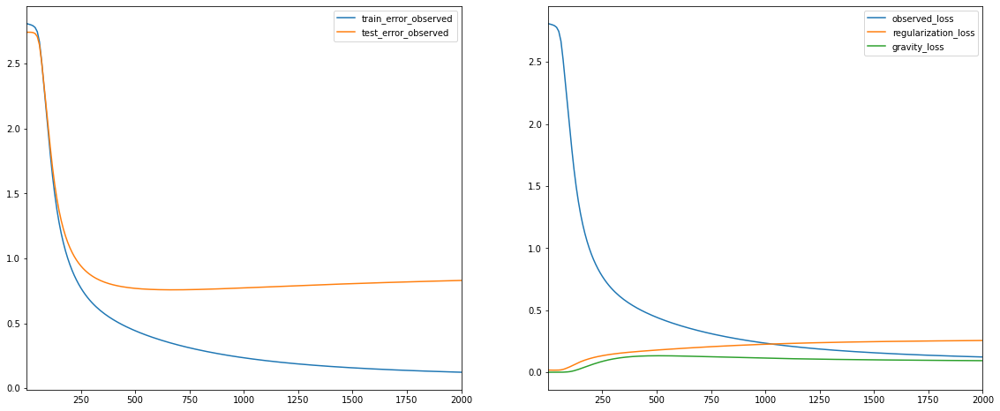

In [22]:
reg_model = build_regularized_model(
    listens, regularization_coeff=0.1, gravity_coeff=1.0, embedding_dim=35,
    init_stddev=.05)
reg_model.train(num_iterations=2000, learning_rate=20.)

Adding the regularization terms results in a slightly higher MSE on the training set, but considerably lowers the MSE for the test set. This trade-off is worthwhile as it will ultimately result in better recommendations.

In the following cells, we display the nearest neighbors, the embedding norms, and the t-SNE projection of the artist embeddings.

In [24]:
artist_neighbors(reg_model, "Coldplay", DOT)
artist_neighbors(reg_model, "Coldplay", COSINE)

Nearest neighbors of : Coldplay.
[Found more than one matching artist. Other candidates: Jay-Z & Coldplay, Coldplay/U2]


,dot score,names
59,15.723,Coldplay
3037,8.765,Regina Spektor
201,8.536,Arctic Monkeys
224,8.522,Green Day
505,8.113,U2
148,8.056,Radiohead


Nearest neighbors of : Coldplay.
[Found more than one matching artist. Other candidates: Jay-Z & Coldplay, Coldplay/U2]


,cosine score,names
59,1.000,Coldplay
8927,0.793,Mark Ronson
10630,0.776,Jam & Spoon
10632,0.762,7 Days Away
10629,0.761,Missing Hours
3655,0.748,Everything Everything


The recommendations here seem to have improved when using dot score, except for the unusual recommendation of Regina Spektor. The rest of the recommendations are highly relevant. However, the recommendations based on cosine similarity seem to have decreased in usefulness. It is now recommending artists with a very low populartiy.

Here we compare the embedding norms for `model` and `reg_model`. 

In [25]:
artist_embedding_norm([model, model_lowinit, reg_model])

alt.HConcatChart(...)

The embedding norms for `reg_model` now follow a nice curve, listen_count is clearly correlated to norm2.

In [26]:
# Visualize the embeddings
tsne_artist_embeddings(reg_model)

Running t-SNE...
[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 17632 samples in 0.016s...


C:\Users\User\anaconda3\envs\ml_recomsys\lib\site-packages\sklearn\manifold\_t_sne.py:790: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(
C:\Users\User\anaconda3\envs\ml_recomsys\lib\site-packages\sklearn\manifold\_t_sne.py:819: FutureWarning: 'square_distances' has been introduced in 0.24 to help phase out legacy squaring behavior. The 'legacy' setting will be removed in 1.1 (renaming of 0.26), and the default setting will be changed to True. In 1.3, 'square_distances' will be removed altogether, and distances will be squared by default. Set 'square_distances'=True to silence this warning.
  warnings.warn(


[t-SNE] Computed neighbors for 17632 samples in 25.751s...
[t-SNE] Computed conditional probabilities for sample 1000 / 17632
[t-SNE] Computed conditional probabilities for sample 2000 / 17632
[t-SNE] Computed conditional probabilities for sample 3000 / 17632
[t-SNE] Computed conditional probabilities for sample 4000 / 17632
[t-SNE] Computed conditional probabilities for sample 5000 / 17632
[t-SNE] Computed conditional probabilities for sample 6000 / 17632
[t-SNE] Computed conditional probabilities for sample 7000 / 17632
[t-SNE] Computed conditional probabilities for sample 8000 / 17632
[t-SNE] Computed conditional probabilities for sample 9000 / 17632
[t-SNE] Computed conditional probabilities for sample 10000 / 17632
[t-SNE] Computed conditional probabilities for sample 11000 / 17632
[t-SNE] Computed conditional probabilities for sample 12000 / 17632
[t-SNE] Computed conditional probabilities for sample 13000 / 17632
[t-SNE] Computed conditional probabilities for sample 14000 / 1763

C:\Users\User\anaconda3\envs\ml_recomsys\lib\site-packages\sklearn\manifold\_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


[t-SNE] KL divergence after 250 iterations with early exaggeration: 78.572250
[t-SNE] KL divergence after 400 iterations: 2.660660


alt.HConcatChart(...)

The embeddings have somewhat more structure than the unregularized case. There appears to be two pretty strong clusters and a couple more less evident clusters.

## Conclusion
This concludes this section on matrix factorization models. We have successfully built a recommender system using matrix factorization. Initially, the recommendations were a bit questionable, the model was poor at identifying and ignoring irrelavant artists. We addressed this and improved the quality of recommendations through regularlization. By inspecting the embedding and experimenting with similarity measures, I have concluded that the dot product is more appropiate for this use case and prodcues better suggestions. However, cosine similrity is better at capturing specific user interests and could be used to help users discover new, lesser know artists.